In [ ]:
from fastai import *
from fastai.vision import *
from fastai.metrics import error_rate
from fastai.callbacks.mem import *
from fastai.callbacks import *
from torchvision.models import *    # import *=all the models from torchvision  

path = Path('data/zgt-1'); path.ls()


[PosixPath('data/zgt-1/val'),
 PosixPath('data/zgt-1/models'),
 PosixPath('data/zgt-1/train')]

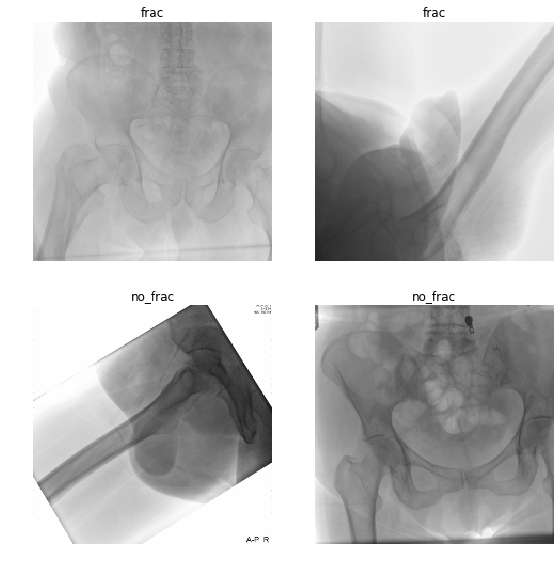

In [ ]:
bs = 16
# This is what we want to flip and move around; we want to do just basic stuff at first
no_tfms = get_transforms(do_flip=False)
tfms = get_transforms(do_flip=True, flip_vert=True, max_rotate=30., max_zoom=1,
                      max_lighting=0.05, max_warp=0)
data = ImageDataBunch.from_folder(path, ds_tfms=no_tfms, size=224, bs=bs).normalize(imagenet_stats)
# lists out the classes
data.classes
data.show_batch(rows=2, figsize=(8,8))



In [ ]:
learn = cnn_learner(data, models.densenet169, metrics=accuracy)
#learn.load('169densenet')

Learner(data=ImageDataBunch;

Train: LabelList (4629 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
nofrac,nofrac,nofrac,nofrac,nofrac
Path: data/zgt-1;

Valid: LabelList (1676 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
nofrac,nofrac,nofrac,nofrac,nofrac
Path: data/zgt-1;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Sequential(
      (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu0): ReLU(inplace)
      (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (denseblock1): _DenseBlock(
        (denselayer1): _DenseLayer(
          (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)

In [ ]:
learn = cnn_learner(data, models.resnet50, metrics=[accuracy, error_rate, Recall(), Precision(), FBeta()])
#learn.fit_one_cycle(8, max_lr=1e-03)
#learn.load('resnet50_new_acc.94')

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


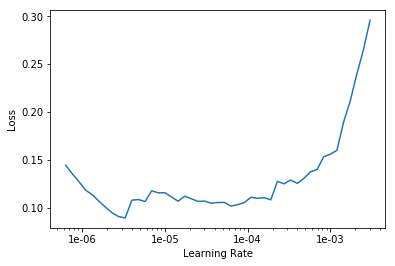

In [ ]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot()

In [ ]:
learn.fit_one_cycle(40, max_lr=slice(1e-06,2e-05))

epoch,train_loss,valid_loss,accuracy,time
0,0.113748,0.158178,0.943317,06:06
1,0.103027,0.161837,0.944511,04:49
2,0.142941,0.160540,0.947494,04:49
3,0.098828,0.162329,0.943317,04:50
4,0.087519,0.166638,0.946897,04:49
5,0.093491,0.170056,0.945704,04:53
6,0.088193,0.164034,0.950477,04:53


KeyboardInterrupt: 

In [ ]:
learn.export('export.pkl')

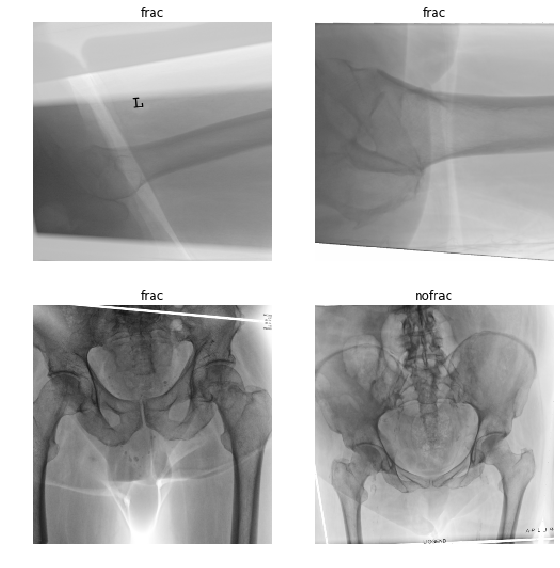

In [ ]:
bs = 32# batch size
#data augmentation
tfms = get_transforms(do_flip=False,)
data = ImageDataBunch.from_folder(path,train='train', ds_tfms=tfms, size=224, bs=bs)
# lists out the classes
#data.classes
#data.normalize() # normalize the data for heatmap visualisation later
data.show_batch(rows=2, figsize=(8,8))


## Plot data augmentation

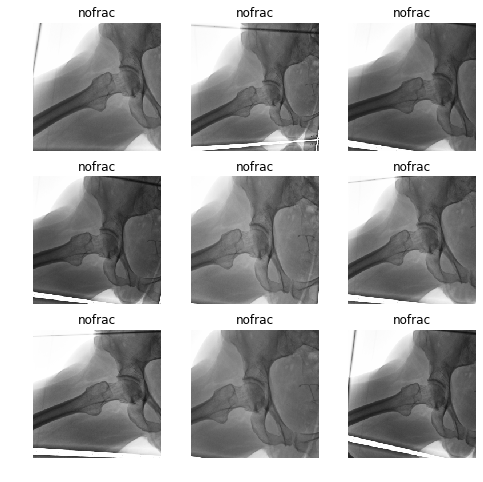

In [ ]:
def _plot(i,j,ax):
    x,y = data.train_ds[3]
    x.show(ax, y=y)

plot_multi(_plot, 3, 3, figsize=(8,8))

## Define model architecture

In [ ]:
#tfms_ = 'Standard' # data transformations
model = resnet50
model_name = str(model).split()[1] 
def getLearner():
    return cnn_learner(data, model, pretrained=True, metrics=[accuracy, error_rate, Recall(), Precision(), FBeta()], 
callback_fns=[ShowGraph, partial(CSVLogger, append=True, filename =model_name + str('_bs:') + str(bs)),
              partial(ReduceLROnPlateauCallback,factor=0.1,min_delta=0.01, patience=3)])
                                 #+ str('_ts:') + str(tfms_))
             # , partial(EarlyStoppingCallback,
       # monitor='accuracy', min_delta=0.01, patience=5), 

learner = getLearner()
#learner.load('169densenet')

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


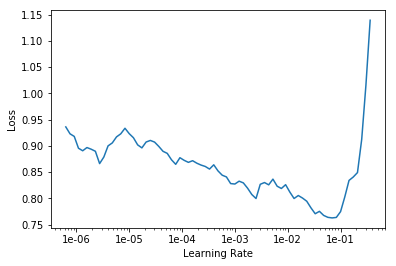

In [ ]:
learner.lr_find()
learner.recorder.plot()


epoch,train_loss,valid_loss,accuracy,time
0,0.434333,0.341283,0.853819,03:22
1,0.445431,0.350294,0.905131,03:20
2,0.420797,0.491924,0.813842,03:25
3,0.358182,0.290430,0.893795,03:22


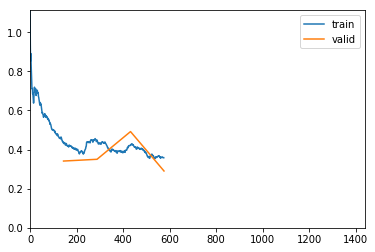

Traceback (most recent call last):
Traceback (most recent call last):
  File "/home/mlemsalu/anaconda3/lib/python3.7/multiprocessing/queues.py", line 242, in _feed
    send_bytes(obj)
  File "/home/mlemsalu/anaconda3/lib/python3.7/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/mlemsalu/anaconda3/lib/python3.7/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "/home/mlemsalu/anaconda3/lib/python3.7/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken pipe
  File "/home/mlemsalu/anaconda3/lib/python3.7/multiprocessing/queues.py", line 242, in _feed
    send_bytes(obj)
  File "/home/mlemsalu/anaconda3/lib/python3.7/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/mlemsalu/anaconda3/lib/python3.7/multiprocessing/connection.py", line 404, in _send_by

KeyboardInterrupt: 

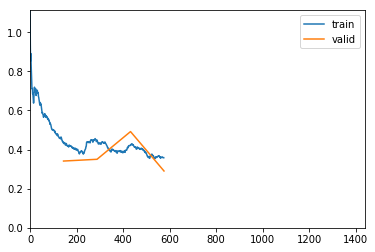

In [ ]:
learner.fit_one_cycle(cyc_len=10, max_lr=2e-02)

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


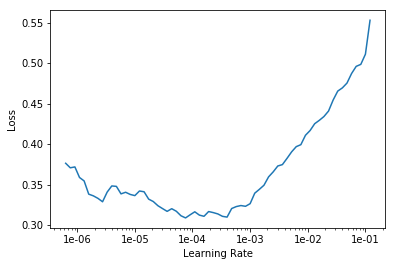

In [ ]:
learner.unfreeze()
learner.lr_find()
learner.recorder.plot()


epoch,train_loss,valid_loss,accuracy,time
0,0.311016,0.252721,0.906325,03:52
1,0.291313,0.248792,0.906921,03:51
2,0.295192,0.239377,0.911098,03:51
3,0.278552,0.227505,0.914081,03:53
4,0.292848,0.224815,0.915871,03:52


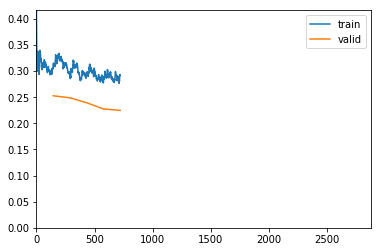

KeyboardInterrupt: 

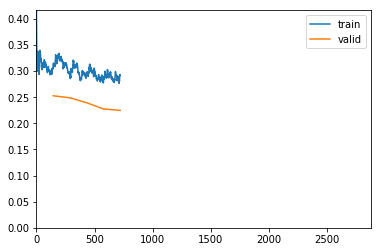

In [ ]:
learner.fit_one_cycle(cyc_len=20, max_lr=slice(1e-7,3e-5), wd=1e-6)

epoch,train_loss,valid_loss,accuracy,time
0,0.281998,0.228612,0.915274,06:16
1,0.335316,0.217632,0.918854,06:14
2,0.305759,0.217566,0.923031,06:13
3,0.312528,0.209809,0.918854,06:14
4,0.272243,0.210386,0.924224,06:16
5,0.236918,0.216285,0.918854,06:16
6,0.236289,0.212761,0.920644,06:17
7,0.251467,0.211918,0.923031,06:17
8,0.206156,0.204884,0.921241,06:17
9,0.175175,0.199973,0.931384,06:19


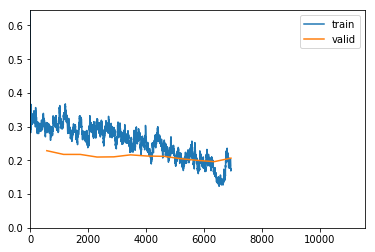

Epoch 5: reducing lr to 9.999999999999999e-06


Traceback (most recent call last):
  File "/home/mlemsalu/anaconda3/lib/python3.7/multiprocessing/queues.py", line 242, in _feed
    send_bytes(obj)
  File "/home/mlemsalu/anaconda3/lib/python3.7/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/mlemsalu/anaconda3/lib/python3.7/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "/home/mlemsalu/anaconda3/lib/python3.7/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken pipe
Traceback (most recent call last):
  File "/home/mlemsalu/anaconda3/lib/python3.7/multiprocessing/queues.py", line 242, in _feed
    send_bytes(obj)
  File "/home/mlemsalu/anaconda3/lib/python3.7/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/mlemsalu/anaconda3/lib/python3.7/multiprocessing/connection.py", line 404, in _send_by

KeyboardInterrupt: 

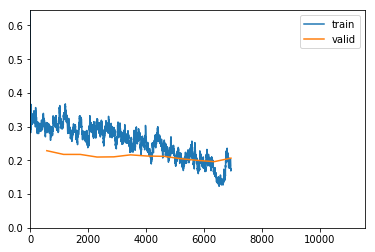

In [ ]:
learner.unfreeze()
learner.fit_one_cycle(cyc_len=20, max_lr=slice(1e-6,1e-4), wd=1e-6)

## Find optimal learning rate and weight decay values

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


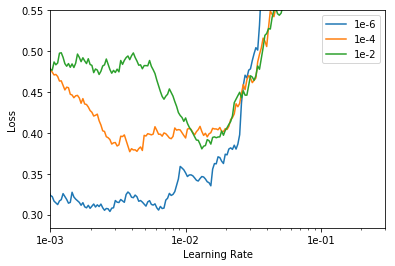

In [ ]:
lrs = []
losses = []
wds = []
iter_count = 600

# WEIGHT DECAY = 1e-6
learner.lr_find(wd=1e-6, num_it=iter_count)
lrs.append(learner.recorder.lrs)
losses.append(learner.recorder.losses)
wds.append('1e-6')
learner = getLearner() #reset learner - this gets more consistent starting conditions

# WEIGHT DECAY = 1e-4
learner.lr_find(wd=1e-4, num_it=iter_count)
lrs.append(learner.recorder.lrs)
losses.append(learner.recorder.losses)
wds.append('1e-4')
learner = getLearner() #reset learner - this gets more consistent starting conditions

# WEIGHT DECAY = 1e-2
learner.lr_find(wd=1e-2, num_it=iter_count)
lrs.append(learner.recorder.lrs)
losses.append(learner.recorder.losses)
wds.append('1e-2')
learner = getLearner() #reset learner

_, ax = plt.subplots(1,1)
min_y = 0.5
max_y = 0.55
for i in range(len(losses)):
    ax.plot(lrs[i], losses[i])
    min_y = min(np.asarray(losses[i]).min(), min_y)
ax.set_ylabel("Loss")
ax.set_xlabel("Learning Rate")
ax.set_xscale('log')
#ax ranges may need some tuning with different model architectures 
ax.set_xlim((1e-3,3e-1))
ax.set_ylim((min_y - 0.02,max_y))
ax.legend(wds)
ax.xaxis.set_major_formatter(plt.FormatStrFormatter('%.0e'))

## Train last layers of the model

In [ ]:
initial_lr = 4e-3
wd = 1e-4

learner.fit_one_cycle(cyc_len=8, max_lr=initial_lr, wd=1e-6)

NameError: ignored

## Unfreeze all layers and find the optimal learning late

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


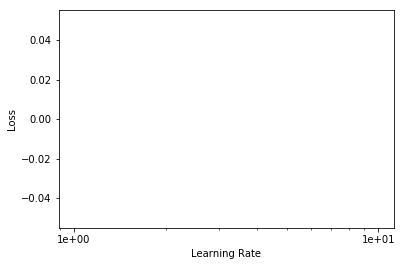

In [ ]:
learner.unfreeze()
learner.lr_find()
learner.recorder.plot()


epoch,train_loss,valid_loss,accuracy,time
0,0.027803,0.392540,0.875298,01:57
1,0.034821,0.406731,0.877685,01:57
2,0.049205,0.402317,0.872315,01:57
3,0.035012,0.390224,0.880668,01:58
4,0.033797,0.391003,0.877685,02:00
5,0.023822,0.389793,0.877685,02:00


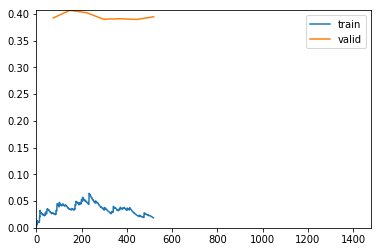

Epoch 3: reducing lr to 1.5199999999999998e-06
Epoch 6: early stopping
Epoch 6: reducing lr to 1.9749280124701748e-06


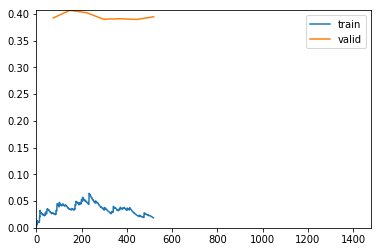

In [ ]:

learner.fit_one_cycle(cyc_len=20, max_lr=slice(2e-6,2e-5), wd=1e-6)

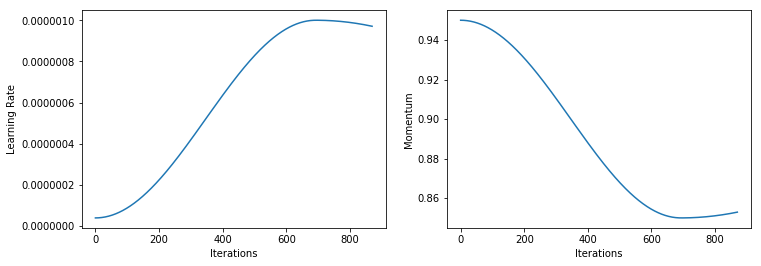

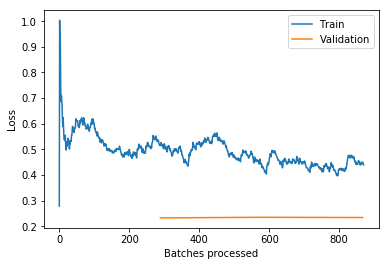

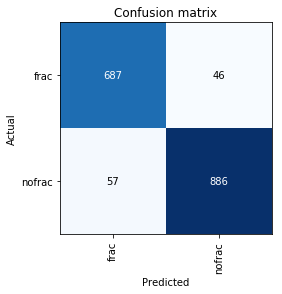

In [ ]:
learner.recorder.plot_lr(show_moms=True)
learner.recorder.plot_losses()
interp = ClassificationInterpretation.from_learner(learner)
interp.plot_confusion_matrix(title='Confusion matrix')

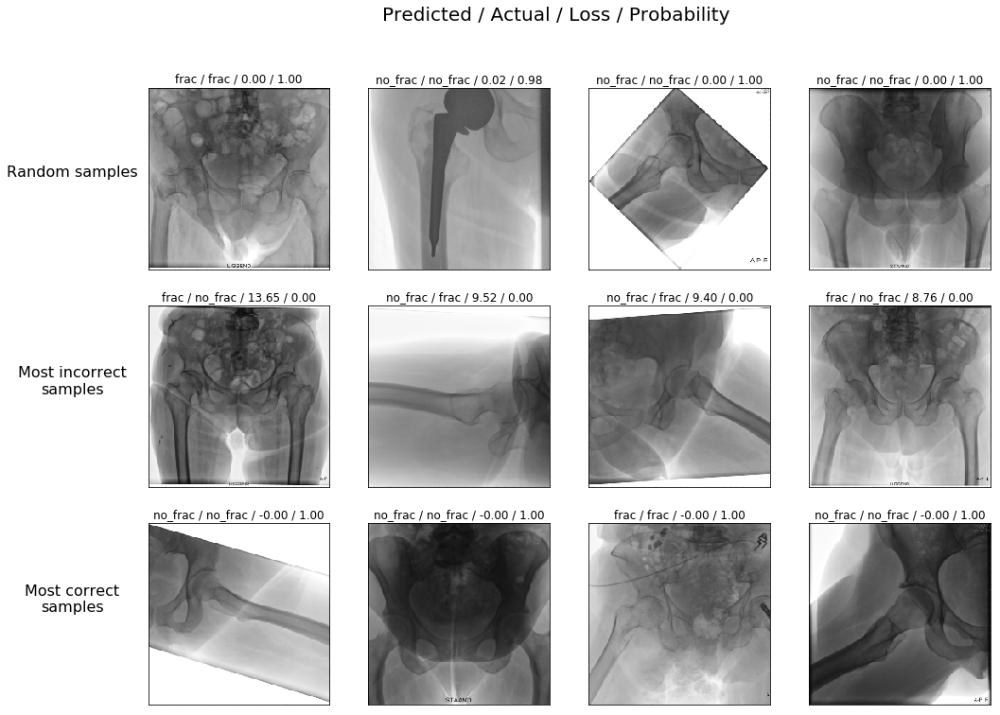

In [ ]:
from random import randint

def plot_overview(interp:ClassificationInterpretation, classes=['frac','no_frac']):
    # top losses will return all validation losses and indexes sorted by the largest first
    tl_val,tl_idx = interp.top_losses()
    #classes = interp.data.classes
    fig, ax = plt.subplots(3,4, figsize=(16,12))
    fig.suptitle('Predicted / Actual / Loss / Probability',fontsize=20)
    # Random
    for i in range(4):
        random_index = randint(0,len(tl_idx))
        idx = tl_idx[random_index]
        im,cl = interp.data.dl(DatasetType.Valid).dataset[idx]
        im = image2np(im.data)
        cl = int(cl)
        ax[0,i].imshow(im)
        ax[0,i].set_xticks([])
        ax[0,i].set_yticks([])
        ax[0,i].set_title(f'{classes[interp.pred_class[idx]]} / {classes[cl]} / {interp.losses[idx]:.2f} / {interp.probs[idx][cl]:.2f}')
    ax[0,0].set_ylabel('Random samples', fontsize=16, rotation=0, labelpad=80)
    # Most incorrect or top losses
    for i in range(4):
        idx = tl_idx[i]
        im,cl = interp.data.dl(DatasetType.Valid).dataset[idx]
        cl = int(cl)
        im = image2np(im.data)
        ax[1,i].imshow(im)
        ax[1,i].set_xticks([])
        ax[1,i].set_yticks([])
        ax[1,i].set_title(f'{classes[interp.pred_class[idx]]} / {classes[cl]} / {interp.losses[idx]:.2f} / {interp.probs[idx][cl]:.2f}')
    ax[1,0].set_ylabel('Most incorrect\nsamples', fontsize=16, rotation=0, labelpad=80)
    # Most correct or least losses
    for i in range(4):
        idx = tl_idx[len(tl_idx) - i - 1]
        im,cl = interp.data.dl(DatasetType.Valid).dataset[idx]
        cl = int(cl)
        im = image2np(im.data)
        ax[2,i].imshow(im)
        ax[2,i].set_xticks([])
        ax[2,i].set_yticks([])
        ax[2,i].set_title(f'{classes[interp.pred_class[idx]]} / {classes[cl]} / {interp.losses[idx]:.2f} / {interp.probs[idx][cl]:.2f}')
    ax[2,0].set_ylabel('Most correct\nsamples', fontsize=16, rotation=0, labelpad=80)
    
interp = ClassificationInterpretation.from_learner(learner)
    
plot_overview(interp, ['frac','no_frac'])


In [ ]:
interp = ClassificationInterpretation.from_learner(learn)


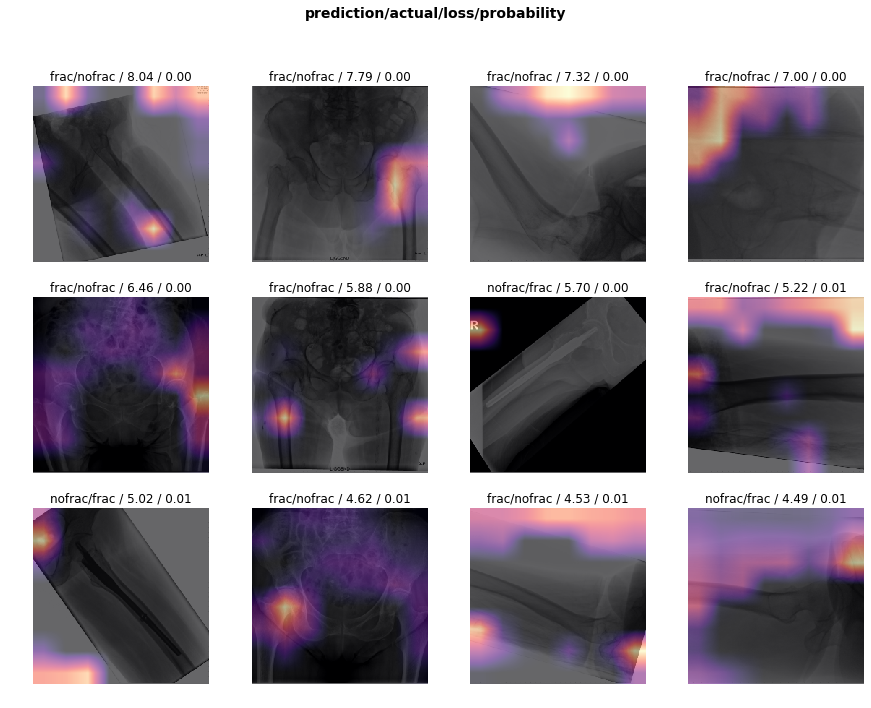

In [ ]:
interp.plot_top_losses(12,heatmap=True, figsize=(15,11))


Category nofrac

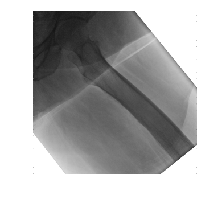

In [ ]:
idx=2
x,y = data.valid_ds[idx]
x.show()
data.valid_ds.y[idx]

In [ ]:
x.data


tensor([[[0.1191, 0.1214, 0.1238,  ..., 1.0000, 1.0000, 1.0000],
         [0.1065, 0.1073, 0.1282,  ..., 1.0000, 1.0000, 1.0000],
         [0.1196, 0.1229, 0.1224,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [0.7500, 0.9377, 1.0000,  ..., 1.0000, 0.9377, 0.7500]],

        [[0.1191, 0.1214, 0.1238,  ..., 1.0000, 1.0000, 1.0000],
         [0.1065, 0.1073, 0.1282,  ..., 1.0000, 1.0000, 1.0000],
         [0.1196, 0.1229, 0.1224,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [0.7500, 0.9377, 1.0000,  ..., 1.0000, 0.9377, 0.7500]],

        [[0.1191, 0.1214, 0.1238,  ..., 1.0000, 1.0000, 1.0000],
         [0.1065, 0.1073, 0.1282,  ..., 1.0000, 1.0000, 1.0000],
         [0.1196, 0.1229, 0.1224,  ..., 1.0000, 1.0000, 1.

In [ ]:
m = learn.model.eval();
xb,_ = data.one_item(x)
xb_im = Image(data.denorm(xb)[0])
xb = xb.cuda()

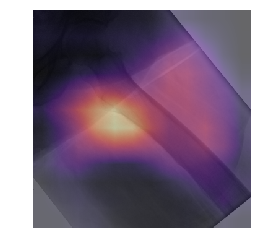

In [ ]:
idx=2
x,y = data.valid_ds[idx]
x.show()
data.valid_ds.y[idx]

m = learn.model.eval();
xb,_ = data.one_item(x)
xb_im = Image(data.denorm(xb)[0])
xb = xb.cuda()

from fastai.callbacks.hooks import *
def hooked_backward(cat=y):
    with hook_output(m[0]) as hook_a: 
        with hook_output(m[0], grad=True) as hook_g:
            preds = m(xb)
            preds[0,int(cat)].backward()
    return hook_a,hook_g

hook_a,hook_g = hooked_backward()
acts  = hook_a.stored[0].cuda()
acts.shape
avg_acts = acts.mean(0)
avg_acts.shape

def show_heatmap(hm):
    _,ax = plt.subplots()
    xb_im.show(ax)
    ax.imshow(hm, alpha=0.6, extent=(0,352,352,0),
              interpolation='bilinear', cmap='magma');
    
show_heatmap(avg_acts)

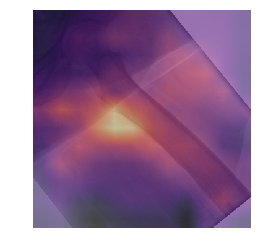

In [ ]:
grad = hook_g.stored[0][0].cuda()
grad_chan = grad.mean(1).mean(1)
grad.shape,grad_chan.shape

mult = (acts*grad_chan[...,None,None]).mean(0)
show_heatmap(mult)



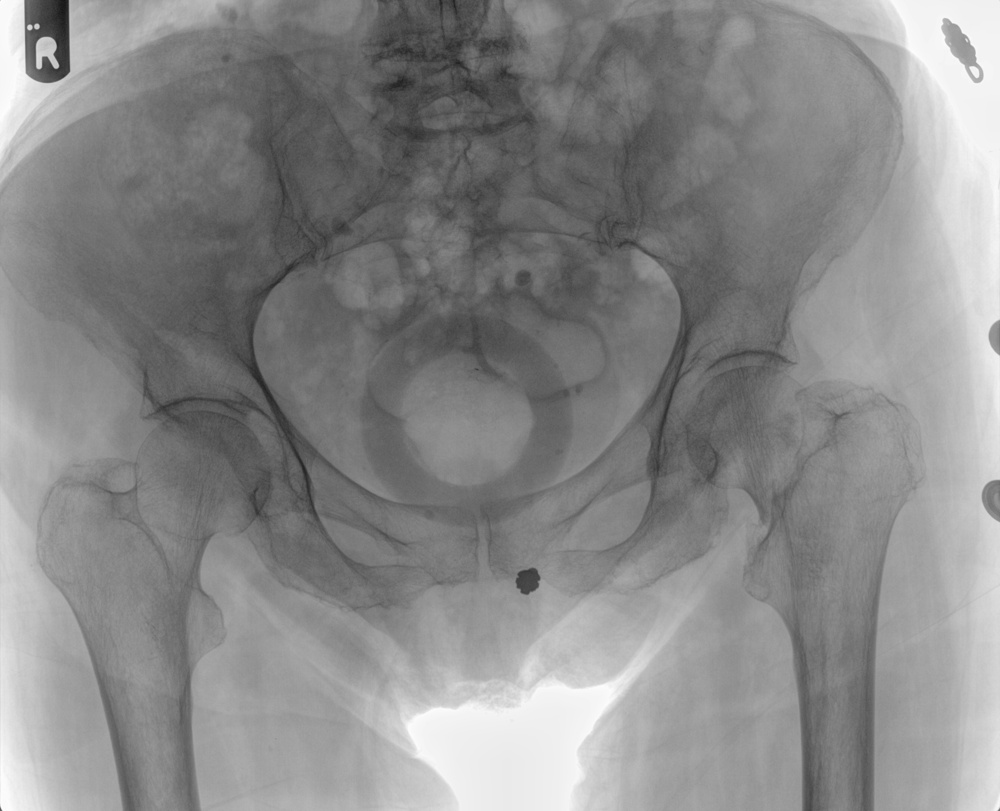

In [ ]:
fn = path/'valid/frac/135151452008200710091141923100.png' #Replace with your own image
x = open_image(fn); x



'frac'

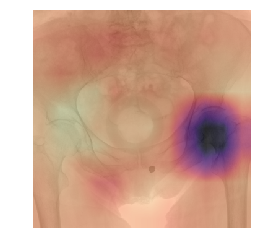

In [ ]:
xb,_ = data.one_item(x)
xb_im = Image(data.denorm(xb)[0])
xb = xb.cuda()

hook_a,hook_g = hooked_backward()

acts = hook_a.stored[0].cpu()
grad = hook_g.stored[0][0].cpu()

grad_chan = grad.mean(1).mean(1)
mult = (acts*grad_chan[...,None,None]).mean(0)

show_heatmap(mult)

data.classes[0]



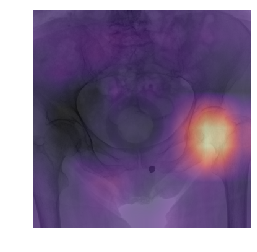

In [ ]:
hook_a,hook_g = hooked_backward(0)
acts = hook_a.stored[0].cuda()
grad = hook_g.stored[0][0].cuda()

grad_chan = grad.mean(1).mean(1)
mult = (acts*grad_chan[...,None,None]).mean(0)
show_heatmap(mult)



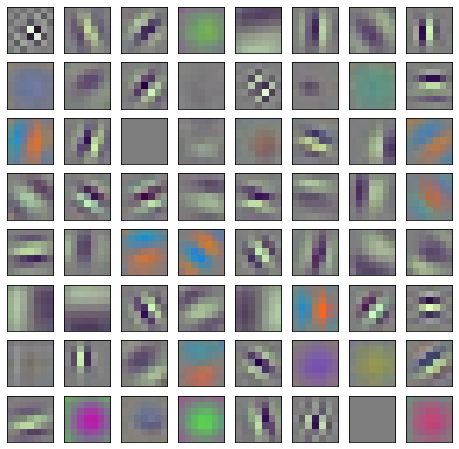

In [ ]:
from sklearn.preprocessing import minmax_scale

def visualize_first_layer(learn, save_name=None):
    conv1 = list(learn.model.children())[0][0]
    if isinstance(conv1, torch.nn.modules.container.Sequential):
        conv1 = conv1[0] # for some models, 1 layer inside
    weights = conv1.weight.data.cpu().numpy()
    weights_shape = weights.shape
    weights = minmax_scale(weights.ravel()).reshape(weights_shape)
    fig, axes = plt.subplots(8, 8, figsize=(8,8))
    for i, ax in enumerate(axes.flat):
        ax.imshow(np.rollaxis(weights[i], 0, 3))
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    if save_name:
        fig.savefig(str(save_name))

visualize_first_layer(learner)

epoch,train_loss,valid_loss,accuracy,time
0,0.124595,0.190638,0.931981,03:42
1,0.194474,0.260847,0.911098,03:40
2,0.236645,0.185065,0.930191,03:41
3,0.215542,0.164937,0.943317,03:42
4,0.186112,0.191649,0.933771,03:42
5,0.134664,0.150693,0.945704,03:45
6,0.093791,0.162897,0.943914,03:45
7,0.066045,0.160223,0.948091,03:42


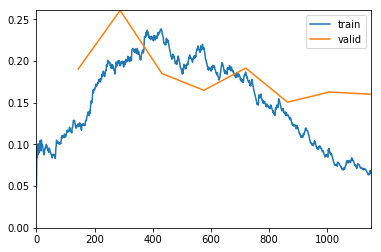

In [ ]:
max_lr = 3e-3
wd = 1e-4
# 1cycle policy
learner.fit_one_cycle(cyc_len=20, max_lr=max_lr, wd=wd, bn_final=True)

In [ ]:
learner.save('168densenet_stage1')

In [ ]:
# before we continue, lets save the model at this stage
learner.save('_stage1')

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


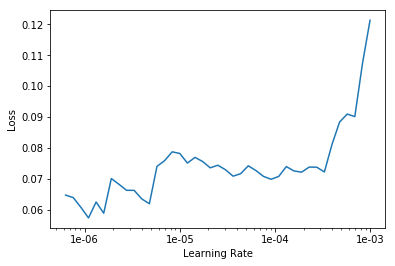

In [ ]:
#learner.load('_stage1')

# unfreeze and run learning rate finder again
learner.unfreeze()
learner.lr_find(wd=wd)

# plot learning rate finder results
learner.recorder.plot()

learner.fit_one_cycle(cyc_len=12, max_lr=slice(1e-5,1e-4))


epoch,train_loss,valid_loss,accuracy,time
0,0.069091,0.167580,0.946301,04:31
1,0.061876,0.177142,0.943914,04:32
2,0.067499,0.173874,0.943914,04:32


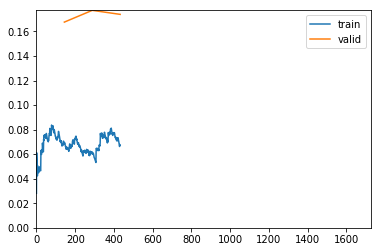

Traceback (most recent call last):
  File "/home/mlemsalu/anaconda3/lib/python3.7/multiprocessing/queues.py", line 242, in _feed
    send_bytes(obj)
  File "/home/mlemsalu/anaconda3/lib/python3.7/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/mlemsalu/anaconda3/lib/python3.7/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "/home/mlemsalu/anaconda3/lib/python3.7/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, buf)
Traceback (most recent call last):
  File "/home/mlemsalu/anaconda3/lib/python3.7/multiprocessing/queues.py", line 242, in _feed
    send_bytes(obj)
Traceback (most recent call last):
  File "/home/mlemsalu/anaconda3/lib/python3.7/multiprocessing/queues.py", line 242, in _feed
    send_bytes(obj)
  File "/home/mlemsalu/anaconda3/lib/python3.7/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset 

KeyboardInterrupt: 

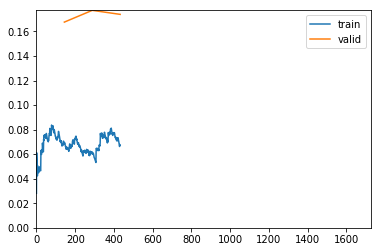

In [ ]:
learner.fit_one_cycle(cyc_len=12, max_lr=slice(1e-5,1e-4))


In [ ]:
learner.save('resnet50_stage2_acc:0.933')

In [ ]:
preds,y, loss = learner.get_preds(with_loss=True)
# get accuracy
acc = accuracy(preds, y)
print('The accuracy is {0} %.'.format(acc))

The accuracy is 0.9331742525100708 %.


### Misclassification

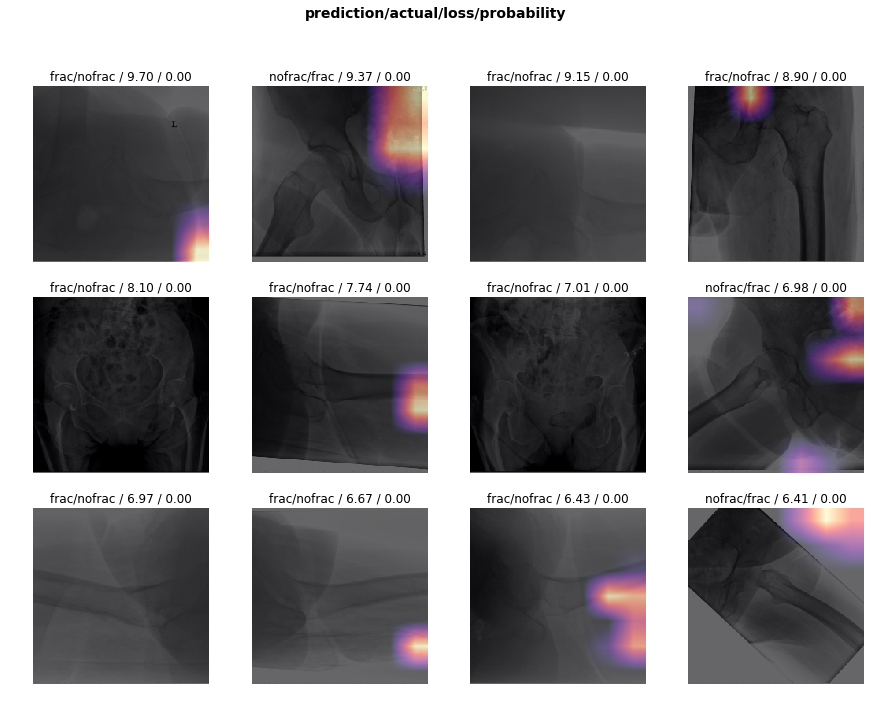

In [ ]:
interp.plot_top_losses(12,heatmap=True, figsize=(15,11))


### fastai implementation

In [ ]:
class ConvBN(nn.Module):
    "convolutional layer then batchnorm"

    def __init__(self, ch_in, ch_out, kernel_size = 3, stride=1, padding=0):
        super().__init__()
        self.conv = nn.Conv2d(ch_in, ch_out, kernel_size=kernel_size, stride=stride, padding=padding, bias=False)
        self.bn = nn.BatchNorm2d(ch_out, momentum=0.01)
        self.relu = nn.LeakyReLU(0.1, inplace=True)

    def forward(self, x): return self.relu(self.bn(self.conv(x)))
    
    
    
class DarknetBlock(nn.Module):
    def __init__(self, ch_in):
        super().__init__()
        ch_hid = ch_in//2
        self.conv1 = ConvBN(ch_in, ch_hid, kernel_size=1, stride=1, padding=0)
        self.conv2 = ConvBN(ch_hid, ch_in, kernel_size=3, stride=1, padding=1)

    def forward(self, x): return self.conv2(self.conv1(x)) + x
    
    
class Darknet(nn.Module):
    "Replicates the darknet classifier from the YOLOv3 paper (table 1)"

    def make_group_layer(self, ch_in, num_blocks, stride=1):
        layers = [ConvBN(ch_in,ch_in*2,stride=stride)]
        for i in range(num_blocks): layers.append(DarknetBlock(ch_in*2))
        return layers

    def __init__(self, num_blocks, num_classes=1000, start_nf=32):
        super().__init__()
        nf = start_nf
        layers = [ConvBN(4, nf, kernel_size=3, stride=1, padding=1)]
        for i,nb in enumerate(num_blocks):
            layers += self.make_group_layer(nf, nb, stride=(1 if i==1 else 2))
            nf *= 2
        layers += [nn.AdaptiveAvgPool2d(1), Flatten(), nn.Linear(nf, num_classes)]
#         layers += [nn.Sigmoid()]
        self.layers = nn.Sequential(*layers)

    def forward(self, x): return self.layers(x)
m = Darknet([1, 2, 4, 4, 3], 28).cuda()

In [ ]:
m

Darknet(
  (layers): Sequential(
    (0): ConvBN(
      (conv): Conv2d(4, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=1e-05, momentum=0.01, affine=True, track_running_stats=True)
      (relu): LeakyReLU(negative_slope=0.1, inplace)
    )
    (1): ConvBN(
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), bias=False)
      (bn): BatchNorm2d(64, eps=1e-05, momentum=0.01, affine=True, track_running_stats=True)
      (relu): LeakyReLU(negative_slope=0.1, inplace)
    )
    (2): DarknetBlock(
      (conv1): ConvBN(
        (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=1e-05, momentum=0.01, affine=True, track_running_stats=True)
        (relu): LeakyReLU(negative_slope=0.1, inplace)
      )
      (conv2): ConvBN(
        (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(64, eps=1e-05, momentum=0.01, affine=

In [ ]:
class FocalLoss(nn.Module):
    def __init__(self, gamma=2):
        super().__init__()
        self.gamma = gamma
        
    def forward(self, input, target):
        if not (target.size() == input.size()):
            raise ValueError("Target size ({}) must be the same as input size ({})"
                             .format(target.size(), input.size()))

        max_val = (-input).clamp(min=0)
        loss = input - input * target + max_val + \
            ((-max_val).exp() + (-input - max_val).exp()).log()

        invprobs = F.logsigmoid(-input * (target * 2.0 - 1.0))
        loss = (invprobs * self.gamma).exp() * loss
        
        return loss.sum(dim=1).mean()

from sklearn.metrics import fbeta_score
import warnings

def f1_(preds, targs, start=0.17, end=0.24, step=0.01):
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        return max([fbeta_score(targs, (preds>th), 1, average='samples')
                    for th in np.arange(start,end,step)])

In [ ]:
learn = Learner.from_model_data(m, md, tmp_name=TMP, models_name=MODEL)
learn.crit = FocalLoss()
learn.opt_fn = optim.Adam
learn.metrics = [f1_]

AttributeError: type object 'Learner' has no attribute 'from_model_data'

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)

losses,idxs = interp.top_losses()

len(data.valid_ds)==len(losses)==len(idxs)


True

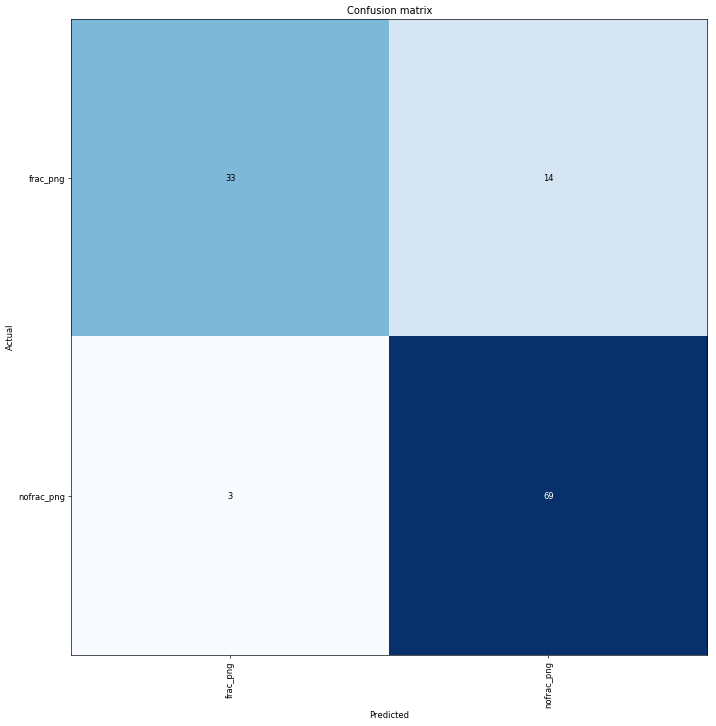

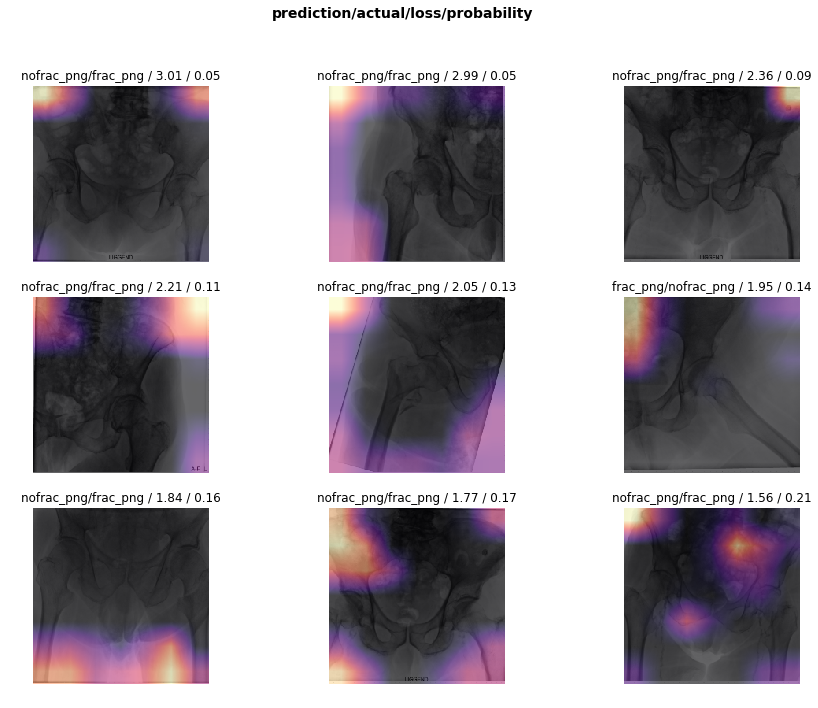

In [ ]:
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

interp.plot_top_losses(9,heatmap=True, figsize=(15,11))

